In [2]:
from collections import Counter
from fastai.text import *
import numpy as np
import pandas as pd
import csv
import html
import random
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import spacy
from spacy.tokens import Doc
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nlp = spacy.load('en_core_web_lg')
import nltk
nltk.download('vader_lexicon')
import time
import seaborn as sns
from pprint import pprint
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
# Enable logging for gensim
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)
import nltk; nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
import pickle
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

In [13]:
BOS = 'xbos'
PATH = Path('data/tweets/')
LM_PATH = Path('model/')

In [4]:
def get_texts(path):
    import io
    texts,users = [],[]
    for fname in (path).glob('*[A-z]*'):
        try:
            with io.open(fname,'r',encoding='utf8') as f:
                for row in f:
                    row = row.split('|')
                    if len(row)==3:
                        users.append(row[0])
                        texts.append(row[1])
        except:
            pass
    return np.array(texts),np.array(users)

In [5]:
texts,users = get_texts(PATH)

In [7]:
col_names = ['user','text']

In [8]:
np.random.seed(42)
idx = np.random.permutation(len(texts))
texts = texts[idx]
users = users[idx]

In [12]:
trn_texts,val_texts = train_test_split(texts, test_size=0.1)
df_trn = pd.DataFrame({'text':trn_texts, 'user':[0]*len(trn_texts)}, columns=col_names)
df_val = pd.DataFrame({'text':val_texts, 'user':[0]*len(val_texts)}, columns=col_names)

In [13]:
df_trn.to_csv(LM_PATH/'train.csv', header=False, index=False)
df_val.to_csv(LM_PATH/'test.csv', header=False, index=False)

In [21]:
def get_texts_2(df):
    users = df.iloc[:,1].values
    texts = f'\n{BOS} ' + df[1].astype(str)
    tok = Tokenizer().process_all(texts)
    return tok, list(users)

def get_all(df):
    tok, users = [], []
    for i, r in enumerate(df):
        print(i)
        tok_, users_ = get_texts_2(r)
        tok += tok_;
        users += users_
    return tok, users

In [3]:
chunksize=24000

In [22]:
df_trn = pd.read_csv(LM_PATH/'train.csv', header=None, chunksize=chunksize)
df_val = pd.read_csv(LM_PATH/'test.csv', header=None, chunksize=chunksize)

tok_trn, trn_users = get_all(df_trn)
tok_val, val_users = get_all(df_val)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
0
1
2
3
4
5
6
7


In [80]:
df_texts = pd.DataFrame({'text':texts, 'user':users}, columns=col_names)

In [81]:
df_texts.head()

,user,text
0,RepJoseSerrano,"With Criollitos de Venezuela, winners of baseb..."
1,govkristinoem,Thank you for stopping in for coffee!
2,RepDonaldPayne,We need to have an honest && meaningful discus...
3,SteveDaines,Excellent briefing from @DeptofDefense Sec Mat...
4,RepCummings,RT @OversightDems: .@RepCummings: Neffenger st...


In [88]:
len(set(users))

592

In [91]:
sentiment_analyzer = SentimentIntensityAnalyzer()
def polarity_scores(doc):
    return sentiment_analyzer.polarity_scores(doc.text)
 
Doc.set_extension('polarity_scores', getter=polarity_scores)

In [92]:
def get_sentiment(text):
    return nlp(text)._.polarity_scores['compound']

In [93]:
def get_embedding(text):
    tweet = nlp(text)
    return tweet.vector

In [96]:
df_texts['sentiment']=df_texts['text'].apply(get_sentiment)

In [97]:
df_texts['embedding']=df_texts['text'].apply(get_embedding)

In [98]:
df_texts.to_csv(LM_PATH/'nlp.csv', header=False, index=False)

In [101]:
df_texts['sentiment'].describe()

count    1.839842e+06
mean     2.228847e-01
std      4.645603e-01
min     -9.890000e-01
25%      0.000000e+00
50%      2.732000e-01
75%      6.249000e-01
max      9.929000e-01
Name: sentiment, dtype: float64

In [117]:
df_texts.iloc[df_texts['sentiment'].idxmin()]

user                                             SenRubioPress
text         Fernando Albán’s tragic death is yet another r...
sentiment                                               -0.989
embedding    [-0.034669943, 0.09076082, 0.009009021, 0.0649...
Name: 59662, dtype: object

In [113]:
df_texts.iloc[df_texts['sentiment'].idxmin()]['text']

'Fernando Albán’s tragic death is yet another reminder of the danger political prisoners in #Venezuela face every day. While the Maduro regime called his death as a suicide, Albán’s fellow prisoners and members of the opposition are calling this a vile murder.'

In [115]:
df_texts.iloc[df_texts['sentiment'].idxmax()]

user                                            RepHankJohnson
text         “And love is love is love is love is love is l...
sentiment                                               0.9929
embedding    [-0.044950467, 0.22405188, -0.062625766, 0.000...
Name: 750928, dtype: object

In [114]:
df_texts.iloc[df_texts['sentiment'].idxmax()]['text']

'“And love is love is love is love is love is love is love is love cannot be killed or swept aside” -- .@lin_manuel. Proud to have earned a 100 on .@HRC congressional scorecard for my support for the #LGBTQ community! '

group by users and aggregate embeddings and sentiments 

In [ ]:
df_texts.groupby('user')

perform LDA to find topics, https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/

In [34]:
df_texts=pd.read_csv(LM_PATH/'nlp.csv',header=None)

In [15]:
df_texts.head()

,0,1,2,3
0,RepJoseSerrano,"With Criollitos de Venezuela, winners of baseb...",0.4767,[ 0.122497 0.087219 0.008324 -0.165395 ... ...
1,govkristinoem,Thank you for stopping in for coffee!,0.2942,[-0.08112 0.207202 -0.215288 -0.099557 ... ...
2,RepDonaldPayne,We need to have an honest && meaningful discus...,0.4404,[-0.075025 0.261593 -0.180871 0.032064 ... ...
3,SteveDaines,Excellent briefing from @DeptofDefense Sec Mat...,0.5994,[-0.097729 0.125237 -0.008259 -0.016844 ... ...
4,RepCummings,RT @OversightDems: .@RepCummings: Neffenger st...,0.4215,[-0.039849 0.125533 0.058215 -0.056136 ... ...


In [36]:
df_texts.columns=['user','text','sentiment','embedding']

In [17]:
df_texts.head()

,user,text,sentiment,embedding
0,RepJoseSerrano,"With Criollitos de Venezuela, winners of baseb...",0.4767,[ 0.122497 0.087219 0.008324 -0.165395 ... ...
1,govkristinoem,Thank you for stopping in for coffee!,0.2942,[-0.08112 0.207202 -0.215288 -0.099557 ... ...
2,RepDonaldPayne,We need to have an honest && meaningful discus...,0.4404,[-0.075025 0.261593 -0.180871 0.032064 ... ...
3,SteveDaines,Excellent briefing from @DeptofDefense Sec Mat...,0.5994,[-0.097729 0.125237 -0.008259 -0.016844 ... ...
4,RepCummings,RT @OversightDems: .@RepCummings: Neffenger st...,0.4215,[-0.039849 0.125533 0.058215 -0.056136 ... ...


In [37]:
#Convert to list
data = df_texts.text.values.tolist()

pprint(data[:1])

['With Criollitos de Venezuela, winners of baseball tournament in Cooperstown '
 'Visiting @Yankees Stadium.@RealMichaelKay ']


In [30]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

data_words = list(sent_to_words(data))

print(data_words[:1])

[['with', 'criollitos', 'de', 'venezuela', 'winners', 'of', 'baseball', 'tournament', 'in', 'cooperstown', 'visiting', 'yankees', 'stadium', 'realmichaelkay']]


In [31]:
pickle.dump(data_words,open(LM_PATH/'data_words.pkl','wb'))

In [32]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100)
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

/anaconda3/lib/python3.7/site-packages/gensim/models/phrases.py:494: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [33]:
pickle.dump(bigram,open(LM_PATH/'bigram.pkl','wb'))
pickle.dump(trigram,open(LM_PATH/'trigram.pkl','wb'))

In [34]:
# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['with', 'criollitos', 'de', 'venezuela', 'winners', 'of', 'baseball', 'tournament', 'in', 'cooperstown', 'visiting', 'yankees_stadium', 'realmichaelkay']


In [35]:
pickle.dump(bigram_mod,open(LM_PATH/'bigram_mod.pkl','wb'))
pickle.dump(trigram_mod,open(LM_PATH/'trigram_mod.pkl','wb'))

In [10]:
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [37]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)
pickle.dump(data_words_nostops,open(LM_PATH/'stop_removed.pkl','wb'))

In [38]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)
pickle.dump(data_words_bigrams,open(LM_PATH/'stop_bigrams.pkl','wb'))

In [39]:
# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])
pickle.dump(data_lemmatized,open(LM_PATH/'data_lemmatized.pkl','wb'))

[['criollito', 'venezuela', 'winner', 'baseball', 'tournament', 'cooperstown', 'visit', 'yankees_stadium', 'realmichaelkay']]


In [40]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

pickle.dump(corpus,open(LM_PATH/'corpus.pkl','wb'))

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)]]


In [ ]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

In [46]:
# Build LDA model
start=time.time()
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=50, 
                                           random_state=100,
                                           chunksize=10000,
                                           passes=1,
                                           per_word_topics=True)
print(f'Topic modeling took {time.time()-start} seconds.')

Topic modeling took 3725.762255191803 seconds.


In [47]:
pickle.dump(lda_model,open(LM_PATH/'lda_model.pkl','wb'))

In [48]:
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(21,
  '0.027*"tax" + 0.025*"american" + 0.024*"cut" + 0.024*"would" + '
  '0.019*"family" + 0.013*"cost" + 0.011*"gop" + 0.011*"plan" + 0.010*"trump" '
  '+ 0.010*"republican"'),
 (44,
  '0.072*"rt" + 0.027*"housedemocrat" + 0.022*"israel" + 0.014*"nancypelosi" + '
  '0.013*"poverty" + 0.012*"stand" + 0.009*"lift" + 0.008*"dreamer" + '
  '0.008*"housegop" + 0.008*"dreamact"'),
 (45,
  '0.044*"safe" + 0.042*"community" + 0.031*"keep" + 0.017*"build" + '
  '0.014*"environment" + 0.014*"protect" + 0.013*"youth" + 0.010*"strong" + '
  '0.009*"help" + 0.008*"proud"'),
 (38,
  '0.062*"new" + 0.027*"texas" + 0.014*"state" + 0.013*"home" + '
  '0.013*"california" + 0.010*"facility" + 0.010*"york" + 0.009*"year" + '
  '0.009*"university" + 0.009*"successful"'),
 (9,
  '0.035*"rt" + 0.024*"nan" + 0.012*"green" + 0.011*"book" + 0.011*"montana" + '
  '0.010*"fox" + 0.010*"thank" + 0.009*"housejudiciary" + 0.008*"today" + '
  '0.008*"dec"'),
 (37,
  '0.033*"help" + 0.027*"federal" + 0.025*"progra

In [49]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -8.880480928112402

Coherence Score:  0.41422427665614137


In [197]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(top_model, corpus, id2word)
vis

/anaconda3/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
21     0.161285  0.124178       1        1  6.833960
24     0.144930 -0.052915       2        1  6.755353
15    -0.073804  0.098992       3        1  6.682581
11    -0.258915 -0.059303       4        1  6.253641
12    -0.158088  0.131809       5        1  5.396085
10    -0.039285 -0.268914       6        1  4.586468
3     -0.206961 -0.035197       7        1  4.480572
2      0.132800  0.069690       8        1  4.077482
16     0.048460  0.118236       9        1  4.021715
8      0.116457 -0.020127      10        1  3.783990
0     -0.053537  0.060258      11        1  3.756450
17     0.116669 -0.052729      12        1  3.739653
9     -0.225637  0.051837      13        1  3.547682
13     0.034573 -0.155475      14        1  3.535209
6      0.106903  0.103482      15        1  3.449303
19    -0.005937 -0.268359      16        1  3.361087
5      0.100158 -0.024595      17        1  3.201983
7      0.101928 -0.021191      18        1  3.101982
14    -0.002688  0.098703      19        1  2.982960
20    -0.151933  0.119780      20        1  2.910663
1      0.122766  0.037730      21        1  2.872161
23     0.141249  0.047061      22        1  2.799638
4     -0.002645 -0.112663      23        1  2.711767
22    -0.168454  0.026291      24        1  2.610732
18     0.019707 -0.016579      25        1  2.546874, topic_info=     Category           Freq           Term          Total  loglift  logprob
term                                                                        
39    Default  353213.000000             rt  353213.000000  30.0000  30.0000
58    Default   61690.000000         health   61690.000000  29.0000  29.0000
114   Default   90404.000000           bill   90404.000000  28.0000  28.0000
107   Default   72503.000000          house   72503.000000  27.0000  27.0000
74    Default   50175.000000           care   50175.000000  26.0000  26.0000
404   Default   62898.000000            job   62898.000000  25.0000  25.0000
1096  Default   40011.000000          happy   40011.000000  24.0000  24.0000
364   Default   54000.000000          honor   54000.000000  23.0000  23.0000
209   Default  103070.000000          great  103070.000000  22.0000  22.0000
97    Default   39041.000000          right   39041.000000  21.0000  21.0000
158   Default   42001.000000          watch   42001.000000  20.0000  20.0000
157   Default   43192.000000            tax   43192.000000  19.0000  19.0000
382   Default   51900.000000          woman   51900.000000  18.0000  18.0000
130   Default   55935.000000           vote   55935.000000  17.0000  17.0000
11    Default  130160.000000          thank  130160.000000  16.0000  16.0000
650   Default   36156.000000         office   36156.000000  15.0000  15.0000
256   Default   50054.000000           pass   50054.000000  14.0000  14.0000
80    Default   80989.000000         family   80989.000000  13.0000  13.0000
215   Default   48662.000000           live   48662.000000  12.0000  12.0000
76    Default   44491.000000         senate   44491.000000  11.0000  11.0000
137   Default   78017.000000           make   78017.000000  10.0000  10.0000
77    Default   23521.000000      statement   23521.000000   9.0000   9.0000
187   Default   57368.000000      president   57368.000000   8.0000   8.0000
240   Default   42744.000000        student   42744.000000   7.0000   7.0000
473   Default   49381.000000        discuss   49381.000000   6.0000   6.0000
174   Default   26372.000000      obamacare   26372.000000   5.0000   5.0000
1022  Default   27171.000000        meeting   27171.000000   4.0000   4.0000
740   Default   70554.000000           year   70554.000000   3.0000   3.0000
416   Default   40250.000000        veteran   40250.000000   2.0000   2.0000
420   Default   24339.000000           tune   24339.000000   1.0000   1.0000
...       ...            ...            ...            ...    

In [50]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
21     0.244851 -0.037197       1        1  3.710264
35    -0.195197 -0.145606       2        1  3.638088
37     0.161292 -0.103493       3        1  3.599042
33     0.091171 -0.124756       4        1  3.535583
12    -0.108862 -0.181174       5        1  3.404843
24     0.156728  0.029296       6        1  3.388251
25     0.110035 -0.088229       7        1  3.340861
11    -0.197588 -0.084041       8        1  3.339306
15     0.074429 -0.147085       9        1  3.157085
6      0.149119 -0.034687      10        1  2.895788
8      0.165885  0.017749      11        1  2.723348
36    -0.122165  0.075696      12        1  2.712550
39     0.118142  0.118441      13        1  2.692403
27     0.176700  0.019517      14        1  2.561937
10    -0.067979  0.177166      15        1  2.547883
13     0.033080  0.089464      16        1  2.520383
43     0.147821 -0.045839      17        1  2.479914
29     0.089316  0.100585      18        1  2.468680
30     0.195432  0.049281      19        1  2.394077
41    -0.111821 -0.080368      20        1  2.294597
47    -0.057805 -0.157523      21        1  2.239696
16     0.035481 -0.083957      22        1  2.168957
48    -0.023563 -0.112519      23        1  1.953721
34     0.083607 -0.020196      24        1  1.742629
45     0.029463 -0.125189      25        1  1.738100
19    -0.107859  0.216372      26        1  1.671805
31    -0.075331 -0.156337      27        1  1.633873
18     0.029678 -0.034726      28        1  1.591962
38    -0.073755 -0.127629      29        1  1.582567
22    -0.018135 -0.060646      30        1  1.522467
2      0.111979  0.103060      31        1  1.397808
26    -0.013207  0.193682      32        1  1.351782
17     0.093249  0.073335      33        1  1.325944
4     -0.138931  0.111844      34        1  1.312034
44    -0.008402  0.099168      35        1  1.275850
32    -0.086319  0.092063      36        1  1.217243
0     -0.060752 -0.067434      37        1  1.208025
46    -0.059998 -0.018087      38        1  1.160909
28     0.006564  0.036868      39        1  1.151187
3     -0.170272 -0.033384      40        1  1.135126
23     0.033190 -0.017198      41        1  1.130739
14     0.029508  0.054993      42        1  1.124752
20    -0.086930 -0.010043      43        1  1.064009
7     -0.073449 -0.007615      44        1  1.055078
49    -0.029332  0.072715      45        1  1.034166
40    -0.110824  0.077385      46        1  1.018339
9     -0.115948  0.059994      47        1  0.962382
5     -0.064341  0.132235      48        1  0.958557
42    -0.077749  0.061716      49        1  0.935214
1     -0.110209  0.042332      50        1  0.930201, topic_info=      Category           Freq            Term          Total  loglift  logprob
term                                                                          
39     Default  352495.000000              rt  352495.000000  30.0000  30.0000
130    Default   59582.000000            vote   59582.000000  29.0000  29.0000
58     Default   59998.000000          health   59998.000000  28.0000  28.0000
114    Default   90750.000000            bill   90750.000000  27.0000  27.0000
404    Default   62050.000000             job   62050.000000  26.0000  26.0000
101    Default  108735.000000            work  108735.000000  25.0000  25.0000
74     Default   49026.000000            care   49026.000000  24.0000  24.0000
107    Default   73555.000000           house   73555.000000  23.0000  23.0000
240    Default   42138.000000         student   42138.000000  22.0000  22.0000
364    Default   51334.000000           honor   51334.000000  21.0000  21.0000
382    Default   51147.000000           woman   51147.000000  20.0000  20.0000
256    Default   50005.000000            pass   50005.000000  19.0000  19.0000
158    Default   42602.000000           watch   42602.000000  18.0000  18.0000
209    Default  

In [12]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=5, step=5):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        start=time.time()
        model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           chunksize=10000,
                                           passes=1,
                                           per_word_topics=True)
        
        print(f'Topic modeling for {num_topics} topics took {time.time()-start} seconds.')
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [14]:
data_lemmatized = pickle.load(open(LM_PATH/'data_lemmatized.pkl','rb'))
id2word = corpora.Dictionary(data_lemmatized)

In [55]:
corpus = pickle.load(open(LM_PATH/'corpus.pkl','rb'))

In [16]:
pickle.dump(id2word,open(LM_PATH/'id2word.pkl','wb'))

In [17]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=5, limit=50, step=5)

Topic modeling for 5 topics took 1381.5917608737946 seconds.
Topic modeling for 10 topics took 756.9287469387054 seconds.
Topic modeling for 15 topics took 682.704962015152 seconds.
Topic modeling for 20 topics took 746.8779051303864 seconds.
Topic modeling for 25 topics took 961.7490150928497 seconds.
Topic modeling for 30 topics took 1150.7971692085266 seconds.
Topic modeling for 35 topics took 1366.5396530628204 seconds.
Topic modeling for 40 topics took 1665.683187007904 seconds.
Topic modeling for 45 topics took 1890.1698911190033 seconds.


In [19]:
pickle.dump(model_list,open(LM_PATH/'model_list.pkl','wb'))
pickle.dump(coherence_values,open(LM_PATH/'coherence_values.pkl','wb'))

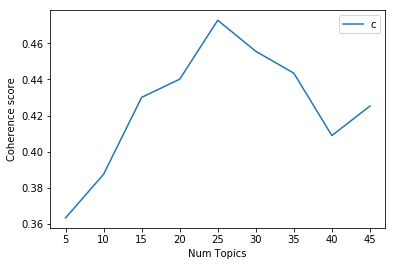

In [20]:
# Show graph
limit=50; start=5; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [28]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 5  has Coherence Value of 0.3635
Num Topics = 10  has Coherence Value of 0.3876
Num Topics = 15  has Coherence Value of 0.4301
Num Topics = 20  has Coherence Value of 0.4401
Num Topics = 25  has Coherence Value of 0.4727
Num Topics = 30  has Coherence Value of 0.4556
Num Topics = 35  has Coherence Value of 0.4435
Num Topics = 40  has Coherence Value of 0.409
Num Topics = 45  has Coherence Value of 0.4253


In [24]:
top_model = model_list[4]

In [27]:
coherence_values[4]

0.47272084109500634

In [26]:
pickle.dump(top_model,open(LM_PATH/'top_model.pkl','wb'))

In [30]:
model_topics = top_model.show_topics(formatted=False)
pprint(top_model.print_topics(num_words=10))

[(1,
  '0.024*"policy" + 0.018*"immigration" + 0.017*"child" + 0.016*"trade" + '
  '0.016*"family" + 0.016*"border" + 0.014*"trump" + 0.012*"immigrant" + '
  '0.011*"rt" + 0.011*"administration"'),
 (9,
  '0.021*"day" + 0.020*"congrat" + 0.019*"win" + 0.012*"congratulation" + '
  '0.012*"go" + 0.011*"today" + 0.010*"team" + 0.010*"great" + 0.009*"game" + '
  '0.008*"national"'),
 (6,
  '0.059*"health" + 0.027*"care" + 0.020*"aca" + 0.017*"insurance" + '
  '0.016*"coverage" + 0.016*"plan" + 0.013*"healthcare" + 0.012*"american" + '
  '0.011*"million" + 0.010*"trumpcare"'),
 (2,
  '0.041*"make" + 0.022*"need" + 0.016*"sure" + 0.015*"child" + 0.013*"water" '
  '+ 0.010*"get" + 0.009*"must" + 0.009*"rt" + 0.009*"kid" + 0.009*"epa"'),
 (0,
  '0.053*"job" + 0.020*"news" + 0.020*"energy" + 0.017*"rt" + 0.015*"create" + '
  '0.014*"economy" + 0.014*"new" + 0.013*"great" + 0.011*"good" + '
  '0.007*"company"'),
 (12,
  '0.038*"honor" + 0.025*"today" + 0.025*"service" + 0.024*"thank" + '
  '0.02

In [69]:
def format_topics_sentences(ldamodel=top_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()
    start = time.time()
    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row[0], key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
        if i%10000==0:
            print(f'{i} rows done in {time.time()-start} seconds.')
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [66]:
len(corpus)

1839842

In [78]:
sample_corpus, sample_data = zip(*random.sample(list(zip(corpus, data)), 360000))

In [79]:
pickle.dump(sample_corpus,open(LM_PATH/'sample_corpus.pkl','wb'))
pickle.dump(sample_data,open(LM_PATH/'sample_data.pkl','wb'))

In [71]:
len(data)

1839842

In [80]:
df_topic_sents_keywords = format_topics_sentences(corpus=sample_corpus, texts=sample_data)

0 rows done in 1.4197769165039062 seconds.
10000 rows done in 994.2861218452454 seconds.
20000 rows done in 1848.936840057373 seconds.
30000 rows done in 2554.1122879981995 seconds.
40000 rows done in 3248.5094277858734 seconds.
50000 rows done in 3944.624029159546 seconds.
60000 rows done in 4649.350461959839 seconds.
70000 rows done in 5349.1865670681 seconds.
80000 rows done in 6132.376891136169 seconds.
90000 rows done in 6998.27114200592 seconds.
100000 rows done in 7842.868110895157 seconds.
110000 rows done in 8903.508712768555 seconds.
120000 rows done in 9835.384542942047 seconds.
130000 rows done in 10754.530714988708 seconds.
140000 rows done in 11622.607710838318 seconds.
150000 rows done in 12728.904756784439 seconds.
160000 rows done in 13987.350237846375 seconds.
170000 rows done in 15005.802462816238 seconds.
180000 rows done in 15889.223049879074 seconds.
190000 rows done in 16985.341339111328 seconds.
200000 rows done in 18354.259955883026 seconds.
210000 rows done in

In [81]:
pickle.dump(df_topic_sents_keywords,open(LM_PATH/'tweet_topics.pkl','wb'))

In [85]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.6477,"make, need, sure, child, water, get, must, rt,...",Now is the time to intensify the fight for our...
1,1,2.0,0.5113,"make, need, sure, child, water, get, must, rt,...",Great for CA water conservation-exceeded goals...
2,2,13.0,0.5001,"rt, look, forward, legislation, bipartisan, in...",Today I joined my colleagues on the House Cybe...
3,3,14.0,0.1965,"rt, world, america, get, word, build, well, ma...","Thanks to Brownfields Program, Tulsa has the B..."
4,4,24.0,0.7749,"bill, house, pass, vote, senate, act, republic...",W/ clock winding down toward a potential gover...
5,5,8.0,0.6800,"president, law, justice, sotu, trump, potus, m...",#FF @AshlyeV @winthropu
6,6,13.0,0.3508,"rt, look, forward, legislation, bipartisan, in...",Sunday marks the 50th anniversary of the Archi...
7,7,12.0,0.3510,"honor, today, service, thank, serve, veteran, ...",I’m grateful to my friend && colleague Rep. Bi...
8,8,12.0,0.4854,"honor, today, service, thank, serve, veteran, ...",RT @HouseGOP: Today we remember #DDay and give...
9,9,14.0,0.3597,"rt, world, america, get, word, build, well, ma...",RT @Ron_Nirenberg: The state does not have a m...


In [82]:
# Group top 5 sentences under each topic
sent_topics_sorteddf = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')
start = time.time()
for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf = pd.concat([sent_topics_sorteddf, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)
    print(f'Group done. Total time {time.time() - start} seconds.')

# Reset Index    
sent_topics_sorteddf.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]
pickle.dump(sent_topics_sorteddf,open(LM_PATH/'topic_tweets.pkl','wb'))
# Show
sent_topics_sorteddf.head()

Group done. Total time 0.32279109954833984 seconds.
Group done. Total time 0.36457324028015137 seconds.
Group done. Total time 0.38863110542297363 seconds.
Group done. Total time 185.11620712280273 seconds.
Group done. Total time 185.17307114601135 seconds.
Group done. Total time 185.23029613494873 seconds.
Group done. Total time 185.30425310134888 seconds.
Group done. Total time 185.36225414276123 seconds.
Group done. Total time 185.40558505058289 seconds.
Group done. Total time 185.52669405937195 seconds.
Group done. Total time 185.58891201019287 seconds.
Group done. Total time 185.67914509773254 seconds.
Group done. Total time 185.71669125556946 seconds.
Group done. Total time 185.73920607566833 seconds.
Group done. Total time 185.7587811946869 seconds.
Group done. Total time 185.81024599075317 seconds.
Group done. Total time 185.83403205871582 seconds.
Group done. Total time 185.86714506149292 seconds.
Group done. Total time 185.8877830505371 seconds.
Group done. Total time 185.903

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.9631,"job, news, energy, rt, create, economy, new, g...",America’s 1st offshore wind farm @DeepwaterWin...
1,1.0,0.9733,"policy, immigration, child, trade, family, bor...",نظام ایران بیرحمانه بالای شهروندان خود ظلم نمو...
2,2.0,0.9467,"make, need, sure, child, water, get, must, rt,...",#PuertoRico still has a long way to go and I r...
3,3.0,0.9543,"office, student, school, today, visit, staff, ...","On Saturday, Feb 3rd, from 9AM-12PM, my staff ..."
4,4.0,0.9435,"rt, woman, thank, work, pay, equal, man, house...",6/10/63- JFK signs Equal Pay Act into law. Un...


In [111]:
sent_topics_sorteddf.groupby('Topic_Num').head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.9631,"job, news, energy, rt, create, economy, new, g...",America’s 1st offshore wind farm @DeepwaterWin...
1,1.0,0.9733,"policy, immigration, child, trade, family, bor...",نظام ایران بیرحمانه بالای شهروندان خود ظلم نمو...
2,2.0,0.9467,"make, need, sure, child, water, get, must, rt,...",#PuertoRico still has a long way to go and I r...
3,3.0,0.9543,"office, student, school, today, visit, staff, ...","On Saturday, Feb 3rd, from 9AM-12PM, my staff ..."
4,4.0,0.9435,"rt, woman, thank, work, pay, equal, man, house...",6/10/63- JFK signs Equal Pay Act into law. Un...
5,5.0,0.9631,"right, rt, protect, vote, must, woman, fight, ...",I will cont. to fight in Congress for strong #...
6,6.0,0.9600,"health, care, aca, insurance, coverage, plan, ...","No matter what someone's medical history is, t..."
7,7.0,0.9400,"statement, read, full, trump, president, secre...",We need new AUMF defining force authorized aga...
8,8.0,0.9600,"president, law, justice, sotu, trump, potus, m...",The President of the United States was implica...
9,9.0,0.9360,"day, congrat, win, congratulation, go, today, ...",Good luck tonight && congrats 2 @ndwbb for mak...


In [110]:
[print(keywords) for keywords in sent_topics_sorteddf.groupby('Topic_Num').head()['Keywords']]

job, news, energy, rt, create, economy, new, great, good, company
policy, immigration, child, trade, family, border, trump, immigrant, rt, administration
make, need, sure, child, water, get, must, rt, kid, epa
office, student, school, today, visit, staff, info, tomorrow, hour, rt
rt, woman, thank, work, pay, equal, man, housegop, support, time
right, rt, protect, vote, must, woman, fight, stand, today, internet
health, care, aca, insurance, coverage, plan, healthcare, american, million, trumpcare
statement, read, full, trump, president, secretary, syria, war, realdonaldtrump, administration
president, law, justice, sotu, trump, potus, must, hold, scotus, abuse
day, congrat, win, congratulation, go, today, team, great, game, national
watch, live, rt, tune, discuss, hear, join, hearing, today, talk
great, thank, today, meeting, meet, morning, discuss, visit, enjoy, talk
honor, today, service, thank, serve, veteran, day, woman, nation, country
rt, look, forward, legislation, bipartisan, i

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [84]:
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.head()

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,2.0,"make, need, sure, child, water, get, must, rt,...",12235.0,0.0340
1,2.0,"make, need, sure, child, water, get, must, rt,...",7681.0,0.0213
2,13.0,"rt, look, forward, legislation, bipartisan, in...",13426.0,0.0373
3,14.0,"rt, world, america, get, word, build, well, ma...",16714.0,0.0464
4,24.0,"bill, house, pass, vote, senate, act, republic...",8223.0,0.0228


In [128]:
new_topics=pd.concat([sent_topics_sorteddf.groupby('Topic_Num').head()[['Keywords']],
           topic_contribution.sort_index(),
          pd.Series(['Economy','Immigration','Environment','Event',
          'Civil Rights','Civil Rights','Healthcare',
          'Defense','Trump','Community','Event','Event',
          'Thanks','Legislation','Trump','Community',
          'Community','Trump','Defense',
          'Legislation','Thanks','Economy','Thanks','Healthcare',
          'Legislation'])],axis=1).groupby(0).sum()

In [187]:
new_topics

,Dominant_Topic
0,
Civil Rights,0.0506
Community,0.1528
Defense,0.0458
Economy,0.1109
Environment,0.0373
Event,0.1849
Healthcare,0.0536
Immigration,0.0213
Legislation,0.1370


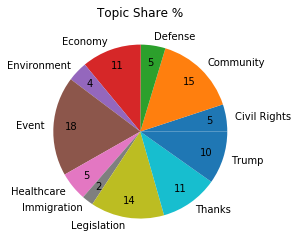

In [179]:
plt.pie(new_topics,labels=new_topics.index,autopct='%.0f',pctdistance=.8)
plt.title('Topic Share %');

In [194]:
new_topic_words = pd.concat([sent_topics_sorteddf.groupby('Topic_Num').head()[['Keywords']],
           topic_contribution.sort_index(),
          pd.Series(['Economy','Immigration','Environment','Event',
          'Civil Rights','Civil Rights','Healthcare',
          'Defense','Trump','Community','Event','Event',
          'Thanks','Legislation','Trump','Community',
          'Community','Trump','Defense',
          'Legislation','Thanks','Economy','Thanks','Healthcare',
          'Legislation'])],axis=1).groupby(0)['Keywords'].sum()

In [196]:
[print(f'{topic}: ' + words) for topic,words in zip(new_topic_words.index,new_topic_words)]

Civil Rights: rt, woman, thank, work, pay, equal, man, housegop, support, timeright, rt, protect, vote, must, woman, fight, stand, today, internet
Community: day, congrat, win, congratulation, go, today, team, great, game, nationalwork, help, community, support, program, business, local, today, center, thankfamily, must, thought, prayer, victim, people, attack, stand, keep, community
Defense: statement, read, full, trump, president, secretary, syria, war, realdonaldtrump, administrationstay, update, rt, israel, state, key, count, obama, important, safe
Economy: job, news, energy, rt, create, economy, new, great, good, companytax, american, cut, family, would, work, people, job, pay, worker
Environment: make, need, sure, child, water, get, must, rt, kid, epa
Event: office, student, school, today, visit, staff, info, tomorrow, hour, rtwatch, live, rt, tune, discuss, hear, join, hearing, today, talkgreat, thank, today, meeting, meet, morning, discuss, visit, enjoy, talk
Healthcare: health

[None, None, None, None, None, None, None, None, None, None, None]

In [121]:
plt.pie(pd.concat([sent_topics_sorteddf.groupby('Topic_Num').head()[['Keywords']],
           topic_contribution.sort_index(),
          pd.Series(['Economy','Immigration','Environment','Event',
          'Civil Rights','Civil Rights','Healthcare',
          'Defense','Trump','Community','Event','Event',
          'Thanks','Legislation','Trumpy','Community',
          'Community','Trump','Defense',
          'Legislation','Thanks','Economy','Thanks','Healthcare',
          'Legislation'])],axis=1).groupby('0').sum())

,Keywords,Dominant_Topic,0
0,"job, news, energy, rt, create, economy, new, g...",0.0340,Economy
1,"policy, immigration, child, trade, family, bor...",0.0213,Immigration
2,"make, need, sure, child, water, get, must, rt,...",0.0373,Environment
3,"office, student, school, today, visit, staff, ...",0.0464,Event
4,"rt, woman, thank, work, pay, equal, man, house...",0.0228,Civil Rights
5,"right, rt, protect, vote, must, woman, fight, ...",0.0278,Civil Rights
6,"health, care, aca, insurance, coverage, plan, ...",0.0308,Healthcare
7,"statement, read, full, trump, president, secre...",0.0267,Defense
8,"president, law, justice, sotu, trump, potus, m...",0.0350,Trump
9,"day, congrat, win, congratulation, go, today, ...",0.0406,Community


In [106]:
topic_contribution.sort_index()

0.0     0.0340
1.0     0.0213
2.0     0.0373
3.0     0.0464
4.0     0.0228
5.0     0.0278
6.0     0.0308
7.0     0.0267
8.0     0.0350
9.0     0.0406
10.0    0.0591
11.0    0.0794
12.0    0.0583
13.0    0.0304
14.0    0.0256
15.0    0.0723
16.0    0.0399
17.0    0.0374
18.0    0.0191
19.0    0.0299
20.0    0.0286
21.0    0.0769
22.0    0.0210
23.0    0.0228
24.0    0.0767
Name: Dominant_Topic, dtype: float64

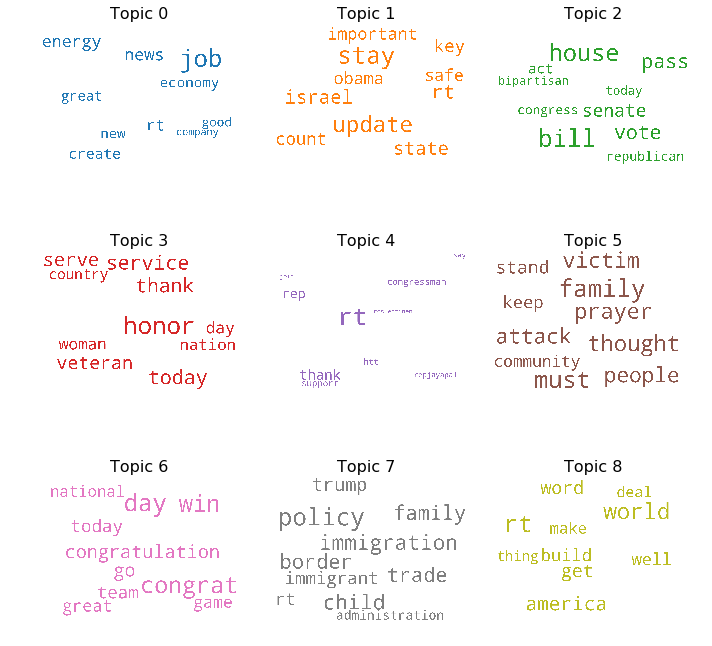

In [201]:
# 1. Wordcloud of Top N words in each topic
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=20,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = top_model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 3, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [219]:
sample_corpus2, sample_data2 = zip(*random.sample(list(zip(sample_corpus, sample_data)), 36000))

In [222]:
# Get topic weights and dominant topics ------------
# Get topic weights
topic_weights = []
for i, row_list in enumerate(top_model[sample_corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 277639 samples in 2.652s...
[t-SNE] Computed neighbors for 277639 samples in 49.852s...
[t-SNE] Computed conditional probabilities for sample 1000 / 277639
[t-SNE] Computed conditional probabilities for sample 2000 / 277639
[t-SNE] Computed conditional probabilities for sample 3000 / 277639
[t-SNE] Computed conditional probabilities for sample 4000 / 277639
[t-SNE] Computed conditional probabilities for sample 5000 / 277639
[t-SNE] Computed conditional probabilities for sample 6000 / 277639
[t-SNE] Computed conditional probabilities for sample 7000 / 277639
[t-SNE] Computed conditional probabilities for sample 8000 / 277639
[t-SNE] Computed conditional probabilities for sample 9000 / 277639
[t-SNE] Computed conditional probabilities for sample 10000 / 277639
[t-SNE] Computed conditional probabilities for sample 11000 / 277639
[t-SNE] Computed conditional probabilities for sample 12000 / 277639
[t-SNE] Computed conditional probab

[t-SNE] Computed conditional probabilities for sample 125000 / 277639
[t-SNE] Computed conditional probabilities for sample 126000 / 277639
[t-SNE] Computed conditional probabilities for sample 127000 / 277639
[t-SNE] Computed conditional probabilities for sample 128000 / 277639
[t-SNE] Computed conditional probabilities for sample 129000 / 277639
[t-SNE] Computed conditional probabilities for sample 130000 / 277639
[t-SNE] Computed conditional probabilities for sample 131000 / 277639
[t-SNE] Computed conditional probabilities for sample 132000 / 277639
[t-SNE] Computed conditional probabilities for sample 133000 / 277639
[t-SNE] Computed conditional probabilities for sample 134000 / 277639
[t-SNE] Computed conditional probabilities for sample 135000 / 277639
[t-SNE] Computed conditional probabilities for sample 136000 / 277639
[t-SNE] Computed conditional probabilities for sample 137000 / 277639
[t-SNE] Computed conditional probabilities for sample 138000 / 277639
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 256000 / 277639
[t-SNE] Computed conditional probabilities for sample 257000 / 277639
[t-SNE] Computed conditional probabilities for sample 258000 / 277639
[t-SNE] Computed conditional probabilities for sample 259000 / 277639
[t-SNE] Computed conditional probabilities for sample 260000 / 277639
[t-SNE] Computed conditional probabilities for sample 261000 / 277639
[t-SNE] Computed conditional probabilities for sample 262000 / 277639
[t-SNE] Computed conditional probabilities for sample 263000 / 277639
[t-SNE] Computed conditional probabilities for sample 264000 / 277639
[t-SNE] Computed conditional probabilities for sample 265000 / 277639
[t-SNE] Computed conditional probabilities for sample 266000 / 277639
[t-SNE] Computed conditional probabilities for sample 267000 / 277639
[t-SNE] Computed conditional probabilities for sample 268000 / 277639
[t-SNE] Computed conditional probabilities for sample 269000 / 277639
[t-SNE] Computed con

In [223]:
# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 25
mycolors = np.array([color for name, color in mcolors.XKCD_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

Loading BokehJS ...